In [1]:
#imports
from galpy.potential import MWPotential2014
from galpy.orbit import Orbit
from galpy.util import bovy_conversion as bc
from astroquery.simbad import Simbad
from astropy import units as u
import numpy as np
import pandas as pd
import math
import random
import matplotlib.pyplot as plt
import matplotlib.font_manager
from astropy.coordinates import SkyCoord
from celluloid import Camera
from IPython.display import HTML
from astropy.coordinates import ICRS
from astropy.coordinates import (CartesianRepresentation, CartesianDifferential)
import astropy.coordinates as coord
import astropy.coordinates as coord
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
import plotly
import plotly.graph_objs as go
from scipy.interpolate import UnivariateSpline

In [2]:
#create galpy orbit object from motion of star. In this case, the sun's orbit is used.
o = Orbit()

In [3]:
#integrate motion of this star object over 10 billion years
ts = np.linspace(0,10.,10000)*u.Gyr
o.integrate(ts, MWPotential2014)

In [4]:
#get star's initial position (x, y, z)
pos_0 = np.array([o.x(), o.y(), o.z()])

#get star's initial velocity vector (Vx, Vy, Vz)
v_0 = np.array([o.vx(),o.vy(),o.vz()])

#create Maxwell-Boltzman distribution function
def maxBoltz(v):
    return (v**2)*((math.e)**(-1*(v**2)/1))

#print graph of maxBoltz
xMB = np.linspace(0.,25., 2000)
yMB = maxBoltz(xMB)

In [5]:
#initialize counter and values
counter = 0
xVals = np.empty(1000)
yVals = np.empty(1000)
zVals = np.empty(1000)
v_xVals = np.empty(1000)
v_yVals = np.empty(1000)
v_zVals = np.empty(1000)

#repeat until 1000 objs are held within the arrays of vals
while counter < 1000:
    #GET DIRECTION OF VELOCITY TO ADD from sphere point picking mathematics
    phi = 2* math.pi * random.random()
    theta = math.acos((2 * random.random()) - 1)
    
    #change to cartesian
    x = math.sin(phi) * math.cos(theta)
    y = math.sin(phi) * math.sin(theta)
    z = math.cos(phi)
    
    direction = np.array([x,y,z])
    
    #GET SPEED OF VELOCITY TO ADD
    rand_X = random.random() * np.amax(xMB)
    rand_Y = random.random() * np.amax(yMB)
    
    if maxBoltz(rand_X) < rand_Y:
        continue
    
    #create vector of velocity & add to star's initial velocity
    velocity = (rand_X * direction) + v_0
    
    #add all the vals to the appropriate numpy array
    xVals[counter] = pos_0[0]
    yVals[counter] = pos_0[1]
    zVals[counter] = pos_0[2]
    v_xVals[counter] = velocity[0]
    v_yVals[counter] = velocity[1]
    v_zVals[counter] = velocity[2]
    
    counter += 1

In [6]:
#create skycoord
co = SkyCoord(x = xVals * u.kpc,\
              y = yVals * u.kpc,\
              z = zVals * u.kpc,\
              v_x = v_xVals * (u.kilometer/u.second),\
              v_y = v_yVals * (u.kilometer/u.second),\
              v_z = v_zVals * (u.kilometer/u.second),\
              representation_type='cartesian',\
              differential_type=CartesianDifferential,\
              frame = 'galactocentric')

In [7]:
#create orbit with all test objects
orbits=Orbit(co)
orbits.integrate(ts, MWPotential2014)

In [8]:
#reinitialize to ensure the same signs (+/-) are used
o = Orbit(SkyCoord(x = o.x() * u.kpc,\
                   y = o.y() * u.kpc,\
                   z = o.z() * u.kpc,\
                   v_x = o.vx() * (u.kilometer/u.second),\
                   v_y = o.vy() * (u.kilometer/u.second),\
                   v_z = o.vz() * (u.kilometer/u.second),\
                   representation_type='cartesian',\
                   differential_type=CartesianDifferential,\
                   frame = 'galactocentric'))
o.integrate(ts,MWPotential2014)

In [9]:
#create numpy arrays for positions and velocities of all 1000 objs at all times
#xPositionsAll[n] gives array of x positions of test object n starting now and going until maxTime. each point is timeDistance apart.
import time as testTime
start = testTime.time()
maxTime = 10 * u.Gyr
maxOrbitNum = 1000
timeDistance =  .1 * u.Myr

timesList = np.arange(0, maxTime.value, timeDistance.to(maxTime.unit).value) * maxTime.unit
orbitNums = np.arange(0, maxOrbitNum)

xPositionsAll = orbits[orbitNums].x(timesList)
yPositionsAll = orbits[orbitNums].y(timesList)
zPositionsAll = orbits[orbitNums].z(timesList)
rPositionsAll = orbits[orbitNums].r(timesList)
xVelocitiesAll = orbits[orbitNums].vx(timesList)
yVelocitiesAll = orbits[orbitNums].vy(timesList)
zVelocitiesAll = orbits[orbitNums].vz(timesList)
xPositionsSun = o.x(timesList)
yPositionsSun = o.y(timesList)
zPositionsSun = o.z(timesList)

end = testTime.time()
print(end - start)

385.36146211624146


In [10]:
#check size of arrays. note that xPositions[x][y] calls for object x position at time y
xPositionsAll.shape[0], xPositionsAll.shape[1]

(1000, 100000)

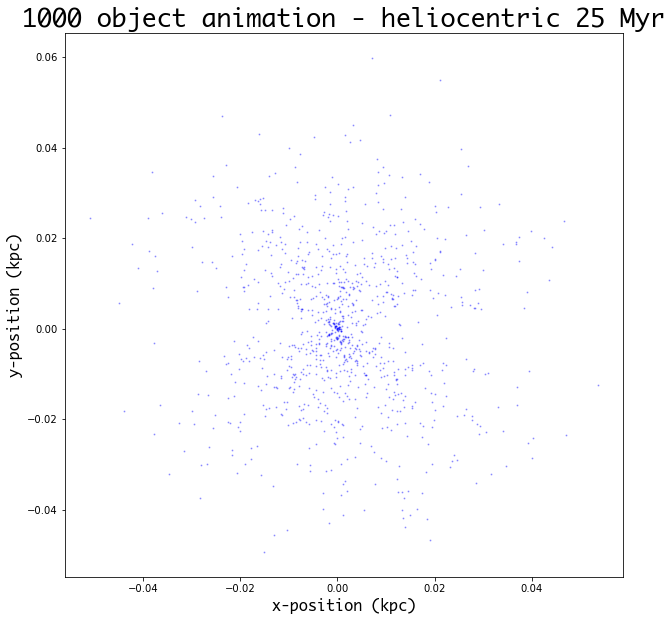

In [11]:
#create animation of all orb objects
fig3 = plt.figure(figsize=(10,10))
ax3 = fig3.add_subplot()
ax3.set_ylabel('y-position (kpc)', fontsize = 15, fontname = 'Ayuthaya')
ax3.set_xlabel('x-position (kpc)', fontsize = 15, fontname = 'Ayuthaya')
ax3.set_title('1000 object animation - heliocentric 25 Myr', fontsize = 25, fontname = 'Ayuthaya')
camera = Camera(fig3)
currColumn = 0

while currColumn < 250:
    plt.scatter(xPositionsAll[:,currColumn] - xPositionsSun[currColumn], yPositionsAll[:, currColumn] - yPositionsSun[currColumn],\
                color = 'Blue', alpha = .3, s = 1, )
    camera.snap()
    currColumn += 1

animation4 = camera.animate(interval = 100)
animation4.save('OneObj.gif', fps = 100)
HTML(animation4.to_html5_video())

In [12]:
#3d plotly plot of all objects at the 250th time
x_arr = (np.transpose(xPositionsAll))[250]
y_arr = (np.transpose(yPositionsAll))[250]
z_arr = (np.transpose(zPositionsAll))[250]

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
trace = go.Scatter3d(
    x=x_arr,  # <-- Put your data instead
    y=y_arr,  # <-- Put your data instead
    z=z_arr,  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 4,
        'opacity': 0.6,
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

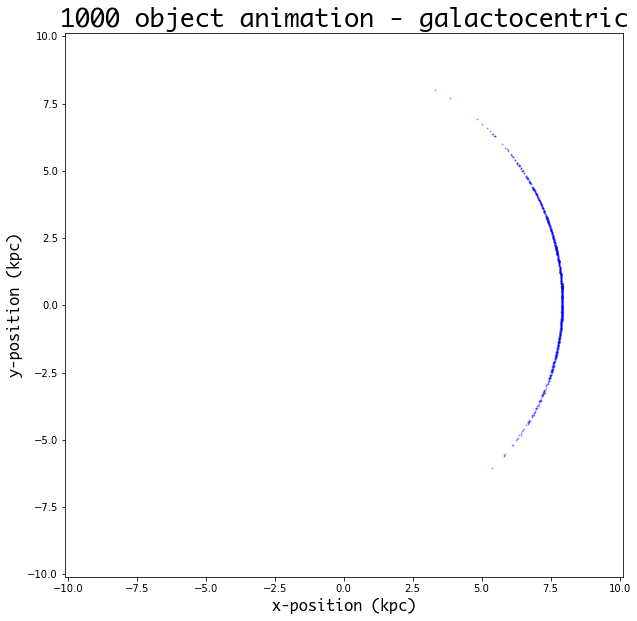

In [13]:
#create animation of all orb objects galactocentric
fig1 = plt.figure(figsize=(10,10)) 
ax1 = fig1.add_subplot()
ax1.set_ylabel('y-position (kpc)', fontsize = 15, fontname = 'Ayuthaya')
ax1.set_xlabel('x-position (kpc)', fontsize = 15, fontname = 'Ayuthaya')
ax1.set_title('1000 object animation - galactocentric', fontsize = 25, fontname = 'Ayuthaya')
camera = Camera(fig1)
currColumn = 0

while currColumn < xPositionsAll.shape[1]/4:
    plt.scatter(xPositionsSun[currColumn], yPositionsSun[currColumn], color = 'Red', alpha = 1, s = 6)
    plt.scatter(xPositionsAll[:,currColumn], yPositionsAll[:, currColumn], color = 'Blue', alpha = .3, s = 1)
    camera.snap()
    currColumn += 25
    
animation3 = camera.animate(interval = 100)
animation3.save('allObjGalactocentricWithSun.gif', fps = 500)
HTML(animation3.to_html5_video())

#code to access column 100
#plt.scatter(xPositionsAll[:,100], yPositionsAll[:, 100])

In [14]:
#3d plotly plot of all objects at the 10000th time
x_arr3 = (np.transpose(xPositionsAll))[10000]
y_arr3 = (np.transpose(yPositionsAll))[10000]
z_arr3 = (np.transpose(zPositionsAll))[10000]

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
trace = go.Scatter3d(
    x=x_arr3,  # <-- Put your data instead
    y=y_arr3,  # <-- Put your data instead
    z=z_arr3,  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 4,
        'opacity': 0.6,
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [15]:
#3d plotly plot of all objects at the 99999th time
x_arr2 = (np.transpose(xPositionsAll))[99999]
y_arr2 = (np.transpose(yPositionsAll))[99999]
z_arr2 = (np.transpose(zPositionsAll))[99999]

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
trace = go.Scatter3d(
    x=x_arr2,  # <-- Put your data instead
    y=y_arr2,  # <-- Put your data instead
    z=z_arr2,  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 4,
        'opacity': 0.6,
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

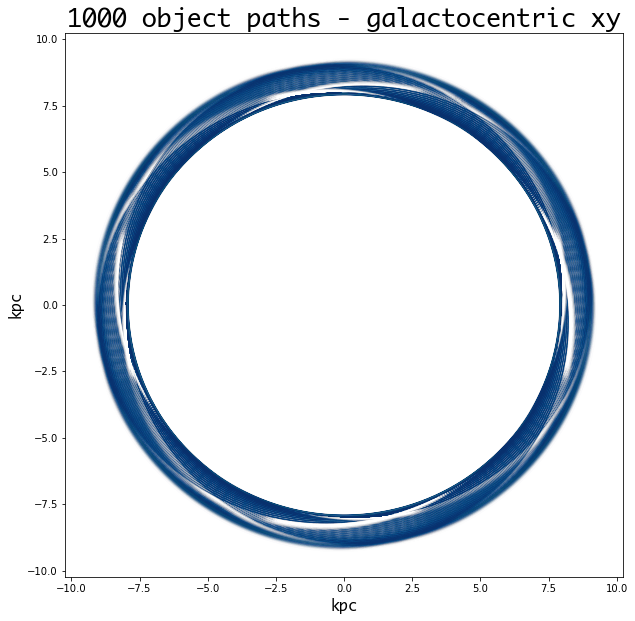

In [16]:
#plot of all 1000 objects' orbits
cmap = cm.get_cmap('Blues')
colors = cmap(np.linspace(0, 1, 100))
fig4 = plt.figure(figsize=(10,10)) 
ax4 = fig4.add_subplot()
ax4.set_ylabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax4.set_xlabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax4.set_title('1000 object paths - galactocentric xy', fontsize = 25, fontname = 'Ayuthaya')
for n in range(1, maxOrbitNum):
    plt.plot(xPositionsAll[n], yPositionsAll[n], alpha = 0.01, color = colors[n % 100], linewidth = 0.15)
#plt.plot(xPositionsAll[0], yPositionsAll[0], alpha = .2, color = 'red')

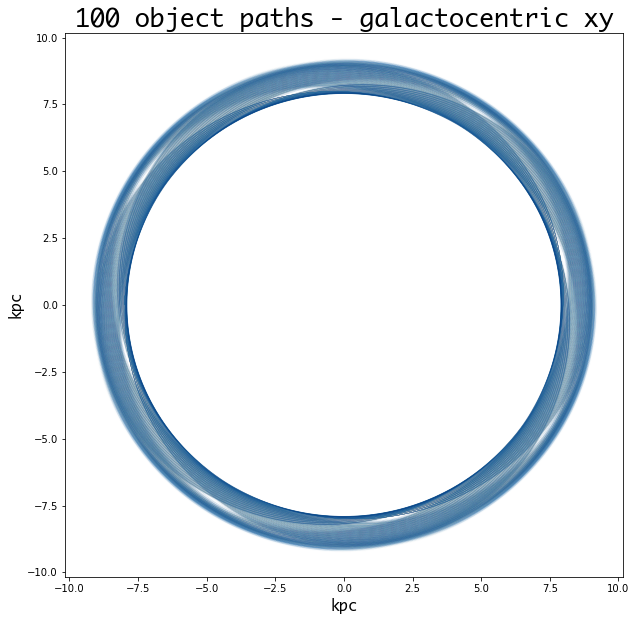

In [17]:
#plot of 100 objects' orbits
#red is sun, blue is 100 test objects
cmap = cm.get_cmap('Blues')
colors = cmap(np.linspace(0, 1, 100))
fig5 = plt.figure(figsize=(10,10)) 
ax5 = fig5.add_subplot()
ax5.set_ylabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax5.set_xlabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax5.set_title('100 object paths - galactocentric xy', fontsize = 25, fontname = 'Ayuthaya')
for n in range(1, 100):
    plt.plot(xPositionsAll[n], yPositionsAll[n], alpha = .1, color = colors[n % 100], linewidth = 0.15)
#plt.plot(xPositionsAll[0], yPositionsAll[0], alpha = .2, color = 'red')

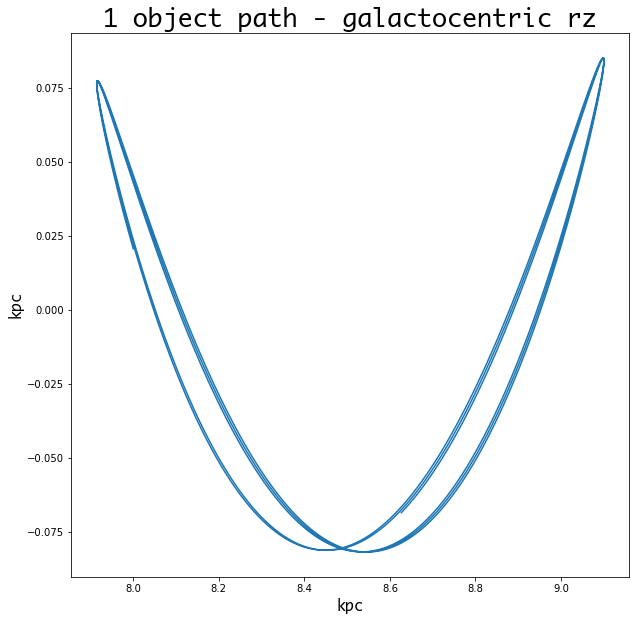

In [18]:
#plot of one object's orbit r vs 
fig6 = plt.figure(figsize=(10,10)) 
ax6 = fig6.add_subplot()
ax6.set_ylabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax6.set_xlabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax6.set_title('1 object path - galactocentric rz', fontsize = 25, fontname = 'Ayuthaya')
plt.plot(rPositionsAll[0][0:5000], zPositionsAll[0][0:5000])

<Figure size 720x720 with 0 Axes>

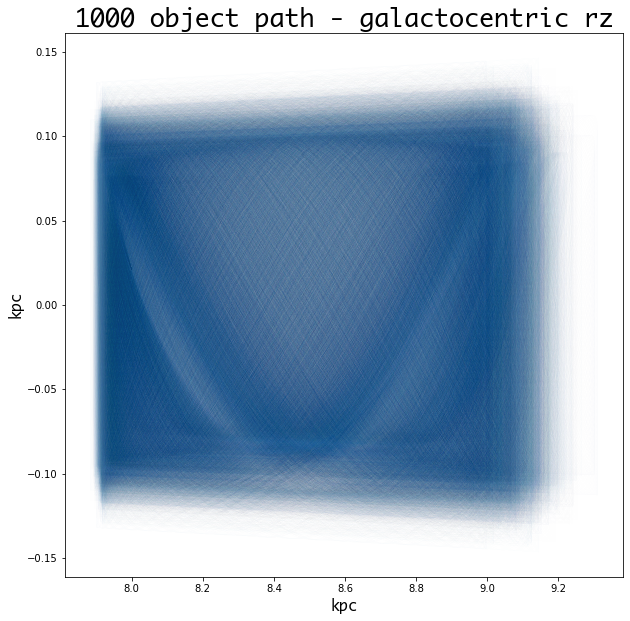

In [19]:
#red is sun, blue is 1000 test objects
cmap = cm.get_cmap('Blues')
colors = cmap(np.linspace(0, 1, 100))
fig7 = plt.figure(figsize=(10,10)) 
fig7 = plt.figure(figsize=(10,10)) 
ax7 = fig7.add_subplot()
ax7.set_ylabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax7.set_xlabel('kpc', fontsize = 15, fontname = 'Ayuthaya')
ax7.set_title('1000 object path - galactocentric rz', fontsize = 25, fontname = 'Ayuthaya')
for n in range(1, maxOrbitNum):
    plt.plot(rPositionsAll[n], zPositionsAll[n], alpha = 0.02, color = colors[n % 100], linewidth = 0.15)
#plt.plot(rPositionsAll[0], zPositionsAll[0], alpha = 1, color = 'red', linewidth = 0.15)